# 1. Imports

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import os
import numpy as np
from torchvision import datasets, models, transforms

from torch.utils.data import DataLoader, TensorDataset, random_split, WeightedRandomSampler
from torchvision.models import resnet18, ResNet18_Weights
from torchvision.models import resnet152, ResNet152_Weights
import torch.optim as optim


import random
import pandas as pd
import pickle

from sklearn.model_selection import train_test_split


from sklearn.model_selection import GroupKFold
from sklearn.model_selection import StratifiedGroupKFold


from codes.utils import stratified_train_test_group_kfold_multilabel
from codes.utils import stratified_train_test_group_kfold
from codes.utils import model_test_classification
from codes.utils import accuracy_classification
from codes.utils import cnn_class_cross_val_final_test, f1score_cnn_fn, confusion_cnn_fn
from codes.utils import accuracy_multilabel, f1score_multilabel, confusion_multilabel
from codes.utils import data_loader_weighted_multilabel,label2class_multilabel
from codes.utils import features_and_targets_center, train_multilabel_full, multilabel_train_folds, multilabel_inference_folds
from codes.utils import sample_one_class


from codes.utils import train_multiclass_full, sample_one_multiclass, train_multiclass_full
from codes.utils import multiclass_train_folds, multiclass_inference_folds, data_loader_test_fn
from codes.utils import load_tiff_to_numpy, extract_data_from_image_files

from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import r2_score  
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score

from collections import Counter
import copy



from skimage.metrics import mean_squared_error as mse
from skimage.feature import canny
from skimage.morphology import binary_dilation, binary_erosion
from scipy.ndimage import label
from scipy.ndimage import labeled_comprehension
from skimage.feature import peak_local_max
from skimage.filters import gaussian
from scipy.ndimage import gaussian_filter, convolve
from sklearn.datasets import make_regression
from sklearn.feature_selection import r_regression
from skimage.feature import local_binary_pattern
from skimage.feature import graycomatrix, graycoprops
from skimage import feature # import blob_dog

from sklearn.linear_model import LinearRegression


from skimage import io, filters, measure, morphology, color
import cv2


from codes.utils_analysis import obtain_rms_roughness, obtain_step_edges, obtain_num_steps, quantify_defect_density
from codes.utils_analysis import obtain_defect_density, calculate_anisotropy, obtain_anisotropy, quantify_local_variation
from codes.utils_analysis import obtain_local_variation, obtain_num_blob_dog, extract_glcm_features
from codes.utils_analysis import obtain_contrast, obtain_dissimilarity, obtain_homogeneity, obtain_energy
from codes.utils_analysis import obtain_correlation, obtain_ASM, obtain_grain_size, obtain_grain_density


use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
torch.backends.cudnn.benchmark = True

torch.backends.cudnn.deterministic = True
random.seed(1)
torch.manual_seed(1)
torch.cuda.manual_seed(1)
np.random.seed(1)


import cv2
import matplotlib.pyplot as plt

from torch import topk
from PIL import Image
import glob


import tifffile



# 2. Data

In [2]:
# Accessing the files from the drive
base_path = '/noether/s0/iam5249/IM_models/AFM_Latent/materials-classification'

drive_prefix ='Data/Tif_Files/'

afm_files = glob.glob(os.path.join( drive_prefix, '*'))
print(f'found {len(afm_files)} raman files in Drive')

found 1026 raman files in Drive


In [7]:
materials_dict = {'MoS2': [1, 0, 1, 0],'WS2': [0, 1, 1, 0], 'WSe2': [0, 1, 0, 1], 'MoSe2': [1, 0, 0, 1], 'Mo-WSe2': [1, 1, 0, 1]}
label_dict = {0: [1, 0, 1, 0], 1:[0, 1, 1, 0], 2:[0, 1, 0, 1], 3:[1, 0, 0, 1], 4:[1, 1, 0, 1]}


X, Y, sampleId, train_val_X, train_val_Y, train_val_groups, test_X, test_Y, test_group = extract_data_from_image_files(afm_files, materials_dict)
group, train_X, train_Y, val_X, val_Y = stratified_train_test_group_kfold_multilabel(train_val_X, train_val_Y,label_dict, train_val_groups, n_splits=10, test_fold=0)

print(test_X.shape)
print(val_X.shape)
print(train_X.shape)
print(test_X.dtype)
print(test_Y.dtype)

print(X.shape)

<class 'generator'>
(104, 3, 224, 224)
(93, 3, 224, 224)
(829, 3, 224, 224)
float64
int64
(1026, 3, 224, 224)


# 3 Inference from Trained Models

In [15]:
drop = 0

pretrain_model = models.resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)

def model_from_pretrain(pretrain_model, drop):

    pretrain_model.fc = nn.Sequential(nn.Linear(2048, 100), #150, 1
                                     nn.ReLU(),

                                     nn.Dropout(p=drop),
                                     nn.Linear(100, 4),
                                    nn.Sigmoid()
                                     )
    pretrain_model.to(device)


    return pretrain_model


transform = transforms.Compose([
  transforms.ToPILImage(),
  #transforms.RandomRotation(degrees= (0, 180)),
  transforms.RandomHorizontalFlip(0.5),
  transforms.RandomVerticalFlip(0.5),
  #transforms.RandomRotation(90),

  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  #transforms.Normalize(mean=mean, std=std),
    ])

transform_test = transforms.Compose([
      transforms.ToPILImage(),

      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
      #transforms.Normalize(mean=mean, std=std),
        ])

batch_size = 1
def cnn_class_metrics(trained_model, data_loader, label_dict,data_type):

    accuracy = accuracy_multilabel(trained_model, data_loader, label_dict,data_type)
    confusion = confusion_multilabel(trained_model, data_loader, label_dict,data_type)
    f1score= f1score_multilabel(trained_model, data_loader,label_dict, data_type)


    return accuracy, confusion, f1score


In [6]:
label_dict = {0: [1, 0, 1, 0], 1:[0, 1, 1, 0], 2:[0, 1, 0, 1], 3:[1, 0, 0, 1], 4:[1, 1, 0, 1]}
n_train, n_val = 7, 3
drop = 0
class_vary = 4

model_path = 'CNNI_Res152_finelabel5.pth'
model_dir = os.path.join(base_path, 'Models')
model_dir = os.path.join(model_dir, model_path)

print("Doing 10 folds inferencing")




Folds_acc, Folds_f1score, Folds_conf = multilabel_inference_folds(pretrain_model, model_from_pretrain, cnn_class_metrics, base_path, model_path, n_train, n_val, train_val_X, train_val_Y, test_X, test_Y,label_dict,train_val_groups, class_vary, batch_size = 1, less_volume=False, drop = 0.0, n_splits=5)

print(f"train_acc: {np.mean(Folds_acc['train']):.4f}, val_acc:  {np.mean(Folds_acc['val']):.4f}, test_acc: {np.mean(Folds_acc['test']):.4f}")

print(f"train_acc: {np.std(Folds_acc['train']):.4f}, val_acc:  {np.std(Folds_acc['val']):.4f}, test_acc: {np.std(Folds_acc['test']):.4f}")

print(f"train_f1: {np.mean(Folds_f1score['train']):.4f}, val_f1:  {np.mean(Folds_f1score['val']):.4f}, test_f1: {np.mean(Folds_f1score['test']):.4f}")

print(f"train_f1: {np.std(Folds_f1score['train']):.4f}, val_f1:  {np.std(Folds_f1score['val']):.4f}, test_f1: {np.std(Folds_f1score['test']):.4f}")


Doing 10 folds inferencing
<class 'generator'>
<class 'generator'>
<class 'generator'>
<class 'generator'>
<class 'generator'>
train_acc: 98.6442, val_acc:  96.5294, test_acc: 88.8462
train_acc: 0.8406, val_acc:  2.7528, test_acc: 2.5512
train_f1: 0.9884, val_f1:  0.9670, test_f1: 0.8973
train_f1: 0.0072, val_f1:  0.0246, test_f1: 0.0234


In [11]:
cm_list = []
for cm in Folds_conf['test']:
    cm_list.append([list(item) for item in cm])
    
#print((cm_list))
extra = [0, 0, 0, 0, 0, 0]
cm_new = []
for fold in cm_list:
    foldn = []
    for row in fold:
        if len(row) == 5:
            row.append(0)
        foldn.append(row)
    if len(foldn)==5:
        foldn.append(extra)
    cm_new.append(foldn)
#print("......")
#print(cm_new)
print(len(cm_new))
print([list(item) for item in np.mean(cm_new, axis=0)])

5
[[42.6, 2.2, 0.2, 0.2, 0.6, 1.2], [3.2, 14.2, 0.0, 0.2, 0.2, 0.2], [0.6, 0.2, 12.2, 0.0, 0.0, 0.0], [1.4, 0.0, 0.2, 10.2, 0.0, 0.2], [0.0, 0.0, 0.0, 0.8, 13.2, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]


# 4 Sample Images

In [6]:
fold = 2
model = model_from_pretrain(pretrain_model, drop)

model_path = 'CNNI_Res152_finelabel5.pth'
model_fold = f'Fold{fold}.pth'

PATH0 = os.path.join(base_path, 'Models')
PATH0 = os.path.join(PATH0, model_path)

model_path1 = os.path.join(PATH0, model_fold)

model.load_state_dict(torch.load(model_path1))
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [17]:
def accuracy_multilabel(trained_model, data_loader,  label_dict, data_type):
    correct = 0
    total = 0
    Labels = []
    Predicted = []    
    trained_model.eval()
    #with torch.no_grad():
    for data in data_loader:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        labels = labels[0]
        label_idx = np.array([i for i in range(len(labels)) if labels[i]==1])
        label_len = len(label_idx)
        label_class = label2class_multilabel(label_dict, label_idx, idx=True)

        outputs = trained_model(images)
        outputs = outputs.detach().cpu()
        sorted_idx = np.argsort(outputs[0])
        pred_idx = sorted_idx[-label_len:]
        pred_idx = np.sort(pred_idx)
        pred_class = label2class_multilabel(label_dict, pred_idx, idx=True)

        #correct += np.sum([idx in pred_idx for idx in label_idx]) == label_len
        if label_class == pred_class:
            correct += 1

        total += 1
        
        Labels.append(label_class)
        Predicted.append(pred_class)

    accuracy = 100 * correct / total
    #print(f'Accuracy of the network on the {total} {data_type} images: {accuracy :.1f} %')

    return accuracy, Labels, Predicted


In [9]:
batch_size = 1
train_loader = data_loader_test_fn(train_X, train_Y, transform_test, batch_size=batch_size)
val_loader = data_loader_test_fn(val_X, val_Y, transform_test, batch_size=batch_size)

test_loader = data_loader_test_fn(test_X, test_Y, transform_test, batch_size=batch_size)

acc_test, test_labels, test_predicted = accuracy_multilabel(model, train_loader, label_dict, 'train')


        
print(acc_test)

test_correctly_predicted = {0:[], 1:[], 2:[], 3:[], 4:[]}
for index, item in enumerate(test_labels):
    if item == test_predicted[index]:
        test_correctly_predicted[item].append(index)

#print(test_correctly_predicted)


group_train = []
train_classes = {0: [], 1: [], 2: [], 3: [], 4: []}
for index, item in enumerate(train_val_Y):
    g = train_val_groups[index]
    if g not in group_train:
        group_train.append(g)
        train_classes[label2class_multilabel(label_dict, item)].append(index)

In [19]:
print(train_classes[3])

[4, 9, 17, 37, 44, 49, 50, 58, 61, 64, 102, 107, 120, 128, 136, 141, 154, 164, 185, 197, 202, 211, 231, 236, 256, 258, 262, 279, 304, 308, 356, 390, 393, 419, 496, 529, 533, 782]


(829, 3, 224, 224)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


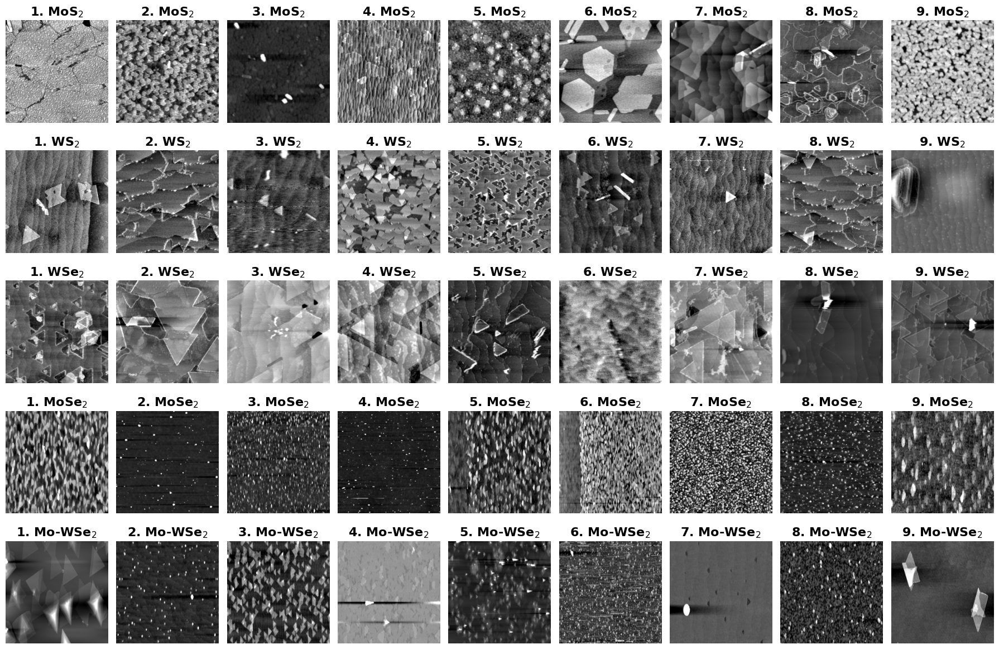

In [12]:
import matplotlib.pyplot as plt
class0 = random.sample(train_classes[0], 9)#[10:]
class1 = random.sample(train_classes[1], 9)#[10:]
class2 = random.sample(train_classes[2], 9)#[10:]
class3= random.sample(train_classes[3], 9)#[10:]
class4= random.sample(train_classes[4], 9)#[5:]
#train_val_X = train_X
#train_X = 
print(train_X.shape)
#_, height, width = test_X[0].shape
j = 0
k = 0
rows = 5
columns = 9

fig, ax = plt.subplots(rows, columns, figsize=(18, 12))
for i in range(columns):

    image0 = train_val_X[class0[i]].transpose(1, 2, 0)
    image1 = train_val_X[class1[i]].transpose(1, 2, 0)
    image2 = train_val_X[class2[i]].transpose(1, 2, 0)
    image3 = train_val_X[class3[i]].transpose(1, 2, 0)
    image4 = train_val_X[class4[i]].transpose(1, 2, 0)
    
    
   
    ax[j, k].imshow(image0, cmap='binary')
    ax[j, k].axis('off')
    ax[j, k].set_title(f'{k+1}. MoS$_2$', size=16,  weight='bold')#' (i)')
    
    ax[j+1, k].imshow(image1,cmap='binary')
    ax[j+1, k].axis('off')
    ax[j+1, k].set_title(f'{k+1}. WS$_2$', size=16,  weight='bold')#' (i)')
    
    ax[j+2, k].imshow(image2,cmap='binary')
    ax[j+2, k].axis('off')
    ax[j+2, k].set_title(f'{k+1}. WSe$_2$', size=16,  weight='bold')#' (i)')
    
    ax[j+3, k].imshow(image3,cmap='binary')
    ax[j+3, k].axis('off')
    ax[j+3, k].set_title(f'{k+1}. MoSe$_2$', size=16,  weight='bold')#' (i)')    
    
    
    ax[j+4, k].imshow(image4,cmap='binary')
    ax[j+4, k].axis('off')
    ax[j+4, k].set_title(f'{k+1}. Mo-WSe$_2$', size=16,  weight='bold')#' (i)')    
    k += 1    
    
    fig.tight_layout()
   
plt.savefig("Results/SampleImages_5materials.pdf", format="pdf", bbox_inches="tight")  
plt.show()

# 5 Extract Features (Trained model)

In [20]:
# Load pre-trained ResNet model

# Choose a specific layer to extract features from
def get_features_from_model(model, images):
    model.eval()
    # Choose a specific layer to extract features from
    target_layer = model.fc[0]  # can be layer1 - layer4, avgpool

    # Define a hook to capture the activations from the target layer

    activations = []


    def hook_fn(module, input, output):
        activations.append(output)



    hook = target_layer.register_forward_hook(hook_fn)


    for image in images:
   
        item_tensor = torch.tensor(image)#, dtype=torch.float32)
        #print(item_tensor.shape)
        input_batch = transform_test(item_tensor).unsqueeze(0).to(device)     
    # Pass the input through the model to trigger the hook and capture activations

        with torch.no_grad():

            _ = model(input_batch)


    # Remove the hook to prevent memory leaks

    hook.remove()
 

# The activations list now contains the convolutional activations from the target layer
    return activations


In [21]:
activations = get_features_from_model(model, features)
print(activations[0].shape)
print(len(activations))
flattened_ImageNet = np.array([a.cpu().numpy() for a in activations]).reshape(len(activations),-1)
print(flattened_ImageNet.shape)

torch.Size([1, 100])
1026
(1026, 100)


In [41]:

materials_dict = {0:'MoS2', 1:'WS2', 2:'WSe2', 3:'MoSe2', 4:'Mo-WSe2'}

MOCVD1_Center_ImageNet = []

for index, sample in enumerate(sampleId):
    this_item = {}

    this_item['sampleId'] = sample
    
    label_class = label2class_multilabel(label_dict, targets[index], idx=False)
    
    this_item['targets'] = materials_dict[label_class]
   
    this_item['ImageNet'] = flattened_ImageNet[index]
   

    MOCVD1_Center_ImageNet.append(this_item)

    #break
             
             
             
print(len(MOCVD1_Center_ImageNet))             
             
df = pd.DataFrame(MOCVD1_Center_ImageNet)

#df.to_pickle('/noether/s0/iam5249/IM_models/AFM_Latent/Data/MOCVD1_Center_5materials_multilabel_ImageNet512.pkl')

1026


# 6 Class Activation Map

In [12]:
fold = 2
model = model_from_pretrain(pretrain_model, drop)

model_path = 'CNNI_Res152_finelabel5.pth'
model_fold = f'Fold{fold}.pth'

PATH0 = os.path.join(base_path, 'Models')
PATH0 = os.path.join(PATH0, model_path)

model_path1 = os.path.join(PATH0, model_fold)

model.load_state_dict(torch.load(model_path1))
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [19]:
def returnCAM(feature_conv, weight_softmax, class_idx):
    # generate the class activation maps upsample to 256x256
    size_upsample = (256, 256)
    bz, nc, h, w = feature_conv.shape
    output_cam = []
    for idx in class_idx:
        cam = weight_softmax[idx].dot(feature_conv.reshape((nc, h*w)))
        cam = cam.reshape(h, w)
        cam = cam - np.min(cam)
        cam_img = cam / np.max(cam)
        cam_img = np.uint8(255 * cam_img)
        output_cam.append(cv2.resize(cam_img, size_upsample))
    return output_cam

transform_cam = transforms.Compose([
     
      transforms.ToTensor(),
     
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

def obtain_CAM(model, class_indices, train_X, material, image_path, rows=3, columns=9):
    _, height, width = train_X[0].shape
    j = 0
    k = 0    

    fig, ax = plt.subplots(rows, columns, figsize=(18, 6))
    for i in range(columns):

        image = train_X[class_indices[i]].transpose(1, 2, 0)
        #image = train_X[i].transpose(1, 2, 0)#.to(device)
        features_blobs = []
        def hook_feature(module, input, output):
            features_blobs.append(output.data.cpu().numpy())
        model._modules.get('layer4').register_forward_hook(hook_feature)

        params = list(model.parameters())
        weight_softmax = np.squeeze(params[-4].data.cpu().numpy())

        image_tensor = transform_cam(image)
        # add batch dimension
        image_tensor = image_tensor.unsqueeze(0).to(device)

        # forward pass through model
        model = model.double()
        outputs = model(image_tensor)
        # get the softmax probabilities
        probs = F.softmax(outputs).data.squeeze()

        #print(probs)
        # get the class indices of top k probabilities
        class_idx = topk(probs, 1)[1].int()
        #print(features_blobs[0].shape, weight_softmax.shape, class_idx.shape)

        CAMs = returnCAM(features_blobs[0], weight_softmax, class_idx)

        heatmap = cv2.applyColorMap(cv2.resize(CAMs[0],(width, height)), cv2.COLORMAP_JET)
        #result = np.invert(heatmap)*0.3 /255. + image
        result = heatmap*0.3 /255. + image
        #cv2.imwrite('temp_1000_cam.png', result)

        image = np.clip(image, 0, 1)

        ax[j, k].imshow(image, cmap='binary')
        ax[j, k].axis('off')
        ax[j, k].set_title(f'{k+1}. {material}', size=16,  weight='bold')#' (i)')
        ax[j+1, k].imshow(heatmap /255.,cmap='jet')
        ax[j+1, k].axis('off')
        #ax[j+1, k].set_title('(ii)')
        ax[j+2, k].imshow(np.clip(result, 0, 1),cmap='jet')
        ax[j+2, k].axis('off')
        #ax[j+2, k].set_title('(iii)')
        k += 1

        fig.tight_layout()

    #plt.savefig(image_path, format="pdf", bbox_inches="tight")  
    plt.show()
    


def obtain_multiple_CAM(model, class_indices, train_X, material, image_path):
    
    print(train_X.shape)
    _, height, width = train_X[0].shape
    j = 0
    k = 0
    rows = 6
    columns = 9

    fig, ax = plt.subplots(rows, columns, figsize=(18, 12))
    for i in range(columns):

        image = train_X[class_indices[i]].transpose(1, 2, 0)
        #image = train_X[i].transpose(1, 2, 0)#.to(device)
        features_blobs = []
        def hook_feature(module, input, output):
            features_blobs.append(output.data.cpu().numpy())
        model._modules.get('layer4').register_forward_hook(hook_feature)

        params = list(model.parameters())
        weight_softmax = np.squeeze(params[-4].data.cpu().numpy())

        image_tensor = transform_cam(image)
        # add batch dimension
        image_tensor = image_tensor.unsqueeze(0).to(device)

        # forward pass through model
        model = model.double()
        outputs = model(image_tensor)
        # get the softmax probabilities
        probs = F.softmax(outputs).data.squeeze()

        #print(probs)
        # get the class indices of top k probabilities
        class_idx = topk(probs, 1)[1].int()
        #print(features_blobs[0].shape, weight_softmax.shape, class_idx.shape)
        class_idx = [[0], [1], [2], [3], [4]]
        CAMs0 = returnCAM(features_blobs[0], weight_softmax, class_idx[0])
        heatmap0 = cv2.applyColorMap(cv2.resize(CAMs0[0],(width, height)), cv2.COLORMAP_JET)
        result0 = heatmap0*0.3 /255. + image

        CAMs1 = returnCAM(features_blobs[0], weight_softmax, class_idx[1])
        heatmap1 = cv2.applyColorMap(cv2.resize(CAMs1[0],(width, height)), cv2.COLORMAP_JET)
        result1 = heatmap1*0.3 /255. + image

        CAMs2 = returnCAM(features_blobs[0], weight_softmax, class_idx[2])
        heatmap2 = cv2.applyColorMap(cv2.resize(CAMs2[0],(width, height)), cv2.COLORMAP_JET)
        result2 = heatmap2*0.3 /255. + image  


        CAMs3 = returnCAM(features_blobs[0], weight_softmax, class_idx[3])
        heatmap3 = cv2.applyColorMap(cv2.resize(CAMs3[0],(width, height)), cv2.COLORMAP_JET)
        result3 = heatmap3*0.3 /255. + image

        CAMs4 = returnCAM(features_blobs[0], weight_softmax, class_idx[4])
        heatmap4 = cv2.applyColorMap(cv2.resize(CAMs4[0],(width, height)), cv2.COLORMAP_JET)
        result4 = heatmap4*0.3 /255. + image


        image = np.clip(image, 0, 1)

        ax[j, k].imshow(image, cmap='binary')
        ax[j, k].axis('off')
        ax[j, k].set_title(f'{k+1}. {material}', size=16,  weight='bold')#' (i)')

        #ax[j+1, k].set_title('(ii)')
        ax[j+1, k].imshow(np.clip(result0, 0, 1),cmap='jet')
        ax[j+1, k].axis('off')
        ax[j+2, k].imshow(np.clip(result1, 0, 1),cmap='jet')
        ax[j+2, k].axis('off')
        ax[j+3, k].imshow(np.clip(result2, 0, 1),cmap='jet')
        ax[j+3, k].axis('off') 
        ax[j+4, k].imshow(np.clip(result3, 0, 1),cmap='jet')
        ax[j+4, k].axis('off') 
        ax[j+5, k].imshow(np.clip(result4, 0, 1),cmap='jet')
        ax[j+5, k].axis('off')    

        k += 1

        fig.tight_layout()
    x0 = -0.004
    y0 = 0.05
    delt = 0.17
    plt.gcf().text(x0, y0, 'Mo-WSe$_2$', rotation='vertical', fontsize=14, color='red',  weight='bold')
    plt.gcf().text(x0, y0+delt, 'MoSe$_2$', rotation='vertical', fontsize=14, color='red',  weight='bold')
    plt.gcf().text(x0, y0+delt*2, 'WSe$_2$', rotation='vertical', fontsize=14, color='red',  weight='bold')
    plt.gcf().text(x0, y0+delt*3, 'WS$_2$', rotation='vertical', fontsize=14, color='red',  weight='bold')
    plt.gcf().text(x0, y0+delt*4, 'MoS$_2$', rotation='vertical', fontsize=14, color='red',  weight='bold')
    #plt.savefig(image_path, format="pdf", bbox_inches="tight")  
    plt.show()

In [18]:
batch_size = 1


train_loader = data_loader_test_fn(train_X, train_Y, transform_test, batch_size=batch_size)
val_loader = data_loader_test_fn(val_X, val_Y, transform_test, batch_size=batch_size)

test_loader = data_loader_test_fn(test_X, test_Y, transform_test, batch_size=batch_size)

acc_test, test_labels, test_predicted = accuracy_multilabel(model, train_loader, label_dict, 'train')

print(acc_test)

test_correctly_predicted = {0:[], 1:[], 2:[], 3:[], 4:[]}
for index, item in enumerate(test_labels):
    if item == test_predicted[index]:
        test_correctly_predicted[item].append(index)

98.19059107358262


(829, 3, 224, 224)


/tmp/ipykernel_343996/3023322768.py:74: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(outputs).data.squeeze()


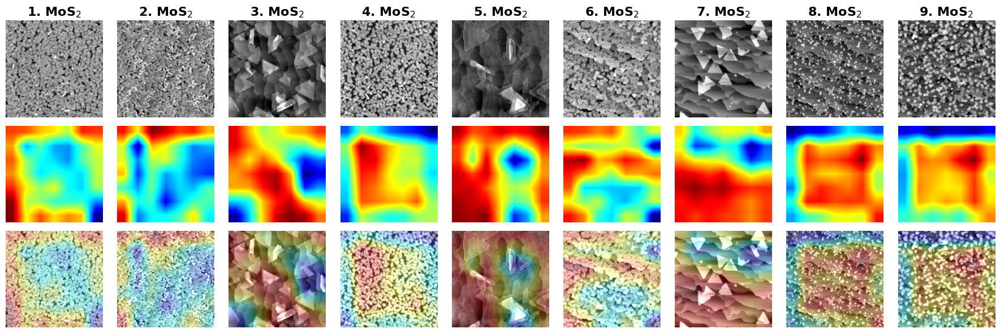

In [20]:
images_indices_MoS2 = test_correctly_predicted[0]#[10:]

print(train_X.shape)
rows = 3
columns = 9
class_indices = images_indices_MoS2
material = 'MoS$_2$'
image_path = 'Results/TMD_cam_MoS2_Center.pdf'
obtain_CAM(model, class_indices, train_X, material, image_path)

(829, 3, 224, 224)


/tmp/ipykernel_297771/3707366699.py:33: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(outputs).data.squeeze()


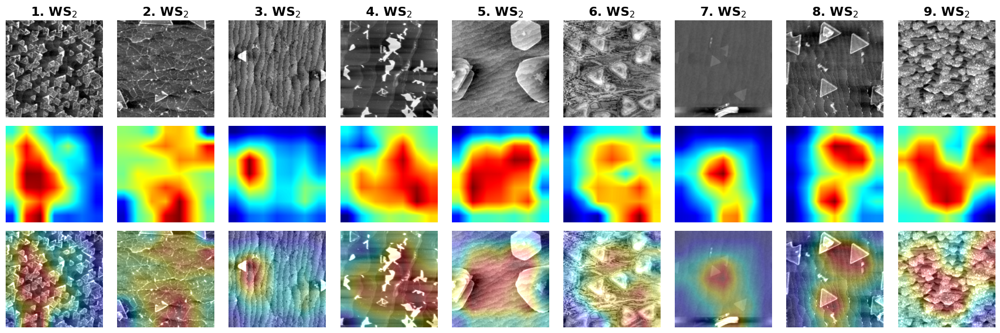

In [21]:
images_indices_WS2 = test_correctly_predicted[1]#[10:]

print(train_X.shape)
rows = 3
columns = 9
class_indices = images_indices_WS2
material = 'WS$_2$'
image_path = 'Results/TMD_cam_WS2_Center.pdf'
obtain_CAM(model, class_indices, train_X, material, image_path)

(829, 3, 224, 224)


/tmp/ipykernel_297771/3707366699.py:33: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(outputs).data.squeeze()


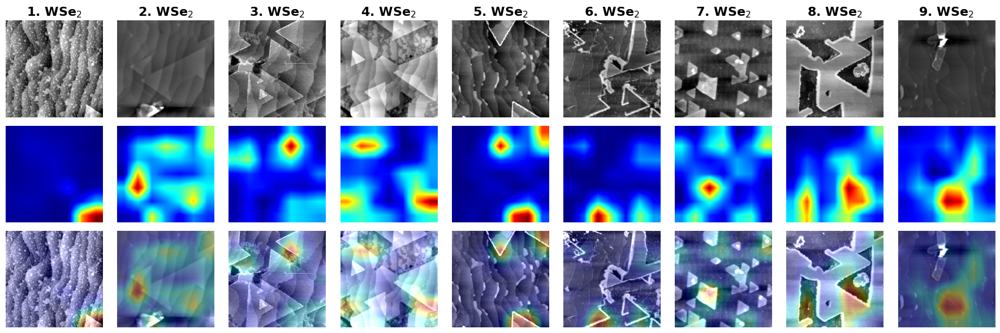

In [22]:
images_indices_WSe2 = test_correctly_predicted[2]#[10:]

print(train_X.shape)
rows = 3
columns = 9
class_indices = images_indices_WSe2
material = 'WSe$_2$'
image_path = 'Results/TMD_cam_WSe2_Center.pdf'
obtain_CAM(model, class_indices, train_X, material, image_path)

(829, 3, 224, 224)


/tmp/ipykernel_297771/3707366699.py:33: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(outputs).data.squeeze()


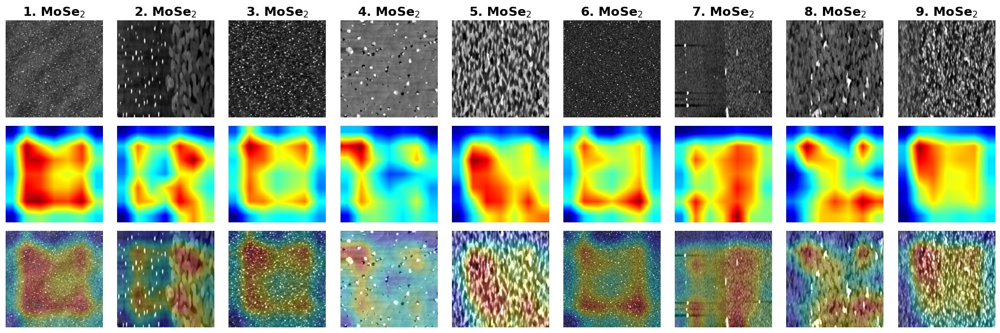

In [24]:
images_indices_MoSe2 = test_correctly_predicted[3][5:]#[10:]

print(train_X.shape)
rows = 3
columns = 9
class_indices = images_indices_MoSe2
material = 'MoSe$_2$'
image_path = 'Results/TMD_cam_MoSe2_Center.pdf'
obtain_CAM(model, class_indices, train_X, material, image_path)

(829, 3, 224, 224)


/tmp/ipykernel_297771/3707366699.py:33: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(outputs).data.squeeze()


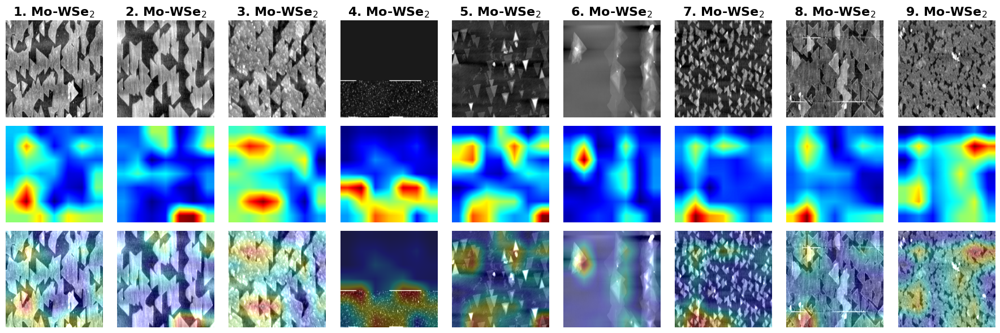

In [25]:
images_indices_MoWSe2 = test_correctly_predicted[4][10:]

print(train_X.shape)
rows = 3
columns = 9
class_indices = images_indices_MoWSe2
material = 'Mo-WSe$_2$'
image_path = 'Results/TMD_cam_Mo-WSe2_Center.pdf'
obtain_CAM(model, class_indices, train_X, material, image_path)

# 7 Activation of Different Classes for a Class of Images

(829, 3, 224, 224)


/tmp/ipykernel_343996/1418049678.py:31: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  probs = F.softmax(outputs).data.squeeze()


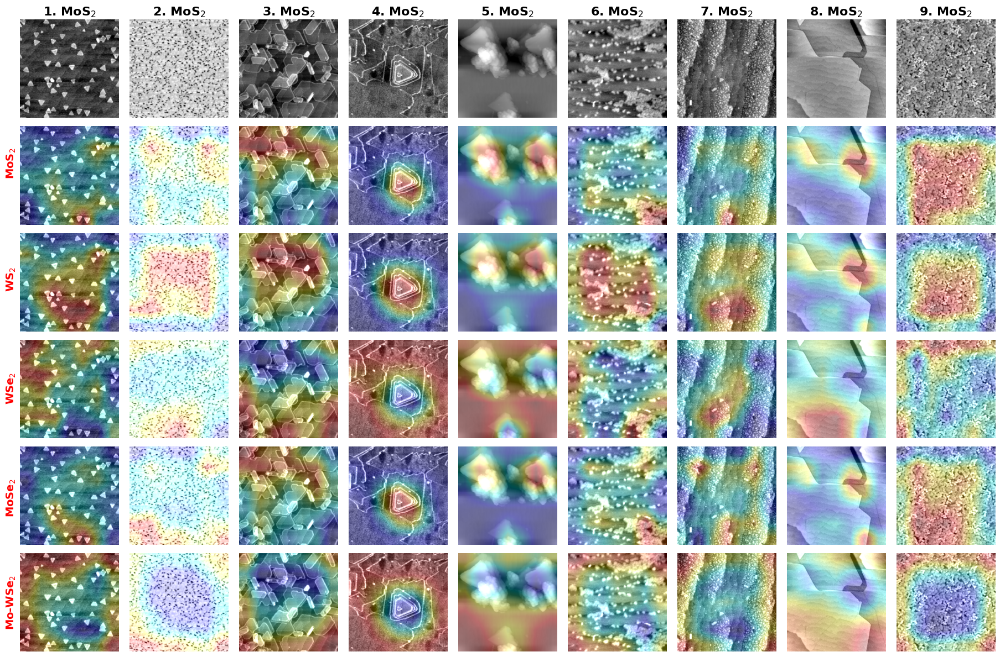

In [24]:
images_indices_MoS2 = random.sample(test_correctly_predicted[0], 9)
image_path = "Results/TMD_cam_MoS2_Center5.pdf"
class_indices = images_indices_MoS2
material = 'MoS$_2$'

obtain_multiple_CAM(model, class_indices, train_X, material, image_path)

# 8 Latent Features Embeddings

In [5]:
extracted = '/noether/s0/iam5249/IM_models/AFM_Latent/Data/MOCVD1_Center_5materials_multilabel_ImageNet512.pkl'

df = pd.read_pickle(extracted)

ImageNet = np.array(list(df['ImageNet']))
Images = X

T_targets = []
for index, target in enumerate(Y):
    label_class = label2class_multilabel(label_dict, target, idx=False)
    T_targets.append(label_class)
T_targets = np.array(T_targets)

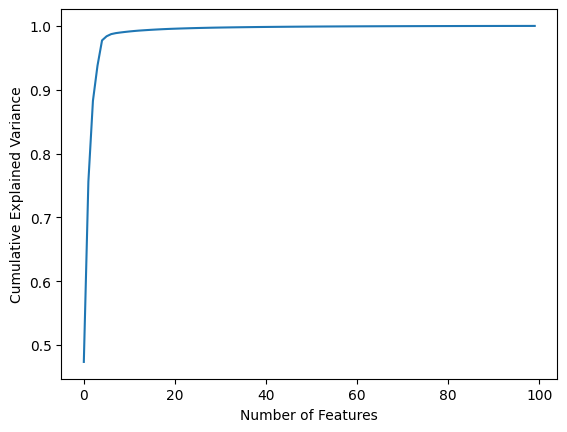

In [7]:
from sklearn.decomposition import PCA
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
##%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

#import seaborn as sns; sns.set()

pca = PCA().fit(ImageNet)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Features')
plt.ylabel('Cumulative Explained Variance')
plt.show()
plt.clf()

pca = PCA(10)  # project from 64 to 2 dimensions 106(0.40)

#Train_X = pca.fit_transform(train_X)
pca.fit(ImageNet)
#Test_X = pca.fit_transform(test_X)
features_10d = pca.transform(ImageNet)
features_2d = features_10d

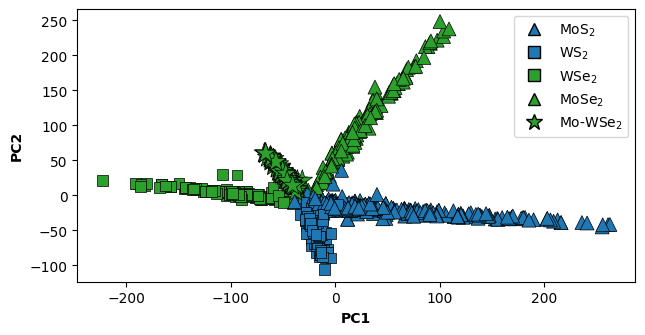

In [46]:
class_dict = {0:'MoS2',1:'WS2', 2:'WSe2', 3:'MoSe2', 4:'Mo-WSe2'}
class_color = {0:'r', 1:'g', 2:'b'}
class_color2 = {0:'tab:brown', 1:'orange', 2:'olive', 3: 'pink', 4: 'purple'}
#{'MoS2': 2, 'WSe2': 1, 'WS2': 0}
hue = [class_dict[item] for item in T_targets]
size = [class_dict[item] for item in T_targets]
#sizes = {0:100, 1:80, 2:80, 3:100, 4:400}
sizes = {'MoS2':100, 'WS2':60, 'WSe2':60, 'MoSe2':100, 'Mo-WSe2':240}
#hue = [class_dict[item] for item in T_target],
colors = {'MoS2': 'tab:blue', 'WS2': 'tab:blue', 'WSe2': 'tab:green', 'MoSe2': 'tab:green', 'Mo-WSe2': 'tab:green'}
markers = {'MoS2': "^", 'WS2': "s", 'WSe2': "s", 'MoSe2': "^", 'Mo-WSe2': "*"}

fig, ax = plt.subplots(figsize=(7.2, 3.54))


# drawing the plot
#sns.barplot(x, y, ax=ax)

sns.scatterplot(x = features_2d[:, 0], y = features_2d[:, 1],style = [class_dict[item] for item in T_targets], markers=markers, hue =hue, size=size, sizes=sizes ,palette = colors,edgecolor='black',linewidth=0.5, ax=ax)


custom = [Line2D([], [], marker=markers['MoS2'],markersize=8, color=colors['MoS2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
          Line2D([], [], marker=markers['WS2'],markersize=8, color=colors['WS2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
         Line2D([], [], marker=markers['WSe2'], markersize=8,color=colors['WSe2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
         Line2D([], [], marker=markers['MoSe2'], markersize=8,color=colors['MoSe2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
         Line2D([], [], marker=markers['Mo-WSe2'], markersize=12,color=colors['Mo-WSe2'], linestyle='None',markeredgecolor='black',markeredgewidth=1)]

#fig = plt.figure(figsize=(8,5))

plt.legend(custom, ['MoS$_2$', 'WS$_2$', 'WSe$_2$', 'MoSe$_2$', 'Mo-WSe$_2$'])#, loc='lower left')

plt.xlabel('PC1',fontweight='bold')
plt.ylabel('PC2',fontweight='bold')
plt.savefig("Results/TMD_pca.pdf", format="pdf", bbox_inches="tight")
plt.show()

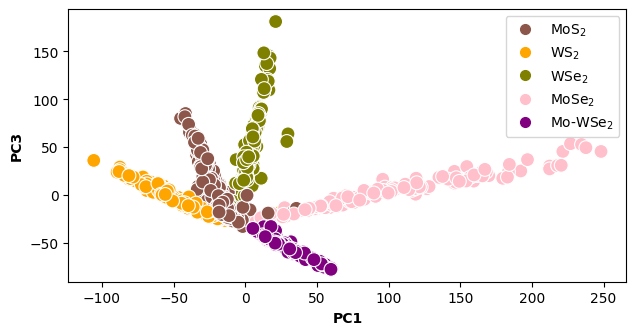

In [7]:
class_dict = {0:'MoS2',1:'WS2', 2:'WSe2', 3:'MoSe2', 4:'Mo-WSe2'}
class_color = {0:'r', 1:'g', 2:'b'}
class_color2 = {0:'tab:brown', 1:'orange', 2:'olive', 3: 'pink', 4: 'purple'}
#{'MoS2': 2, 'WSe2': 1, 'WS2': 0}

#hue = [class_dict[item] for item in T_target],
colors = {'MoS2': 'tab:brown', 'WS2': 'orange', 'WSe2': 'olive', 'MoSe2': 'pink', 'Mo-WSe2': 'purple'}

fig, ax = plt.subplots(figsize=(7.2, 3.54))


# drawing the plot
#sns.barplot(x, y, ax=ax)

sns.scatterplot(x = features_2d[:, 1], y = features_2d[:, 2], hue = [class_dict[item] for item in T_targets],palette = colors, s=100, ax=ax)


custom = [Line2D([], [], marker='.',markersize=14, color=class_color2[0], linestyle='None'),
          Line2D([], [], marker='.',markersize=14, color=class_color2[1], linestyle='None'),
         Line2D([], [], marker='.', markersize=14,color=class_color2[2], linestyle='None'),
         Line2D([], [], marker='.', markersize=14,color=class_color2[3], linestyle='None'),
         Line2D([], [], marker='.', markersize=14,color=class_color2[4], linestyle='None')]

#fig = plt.figure(figsize=(8,5))

plt.legend(custom, ['MoS$_2$', 'WS$_2$', 'WSe$_2$', 'MoSe$_2$', 'Mo-WSe$_2$'])#, loc='upper left')

plt.xlabel('PC1',fontweight='bold')
plt.ylabel('PC3',fontweight='bold')
#plt.savefig("Result/class_pca.pdf", format="pdf", bbox_inches="tight")
plt.show()

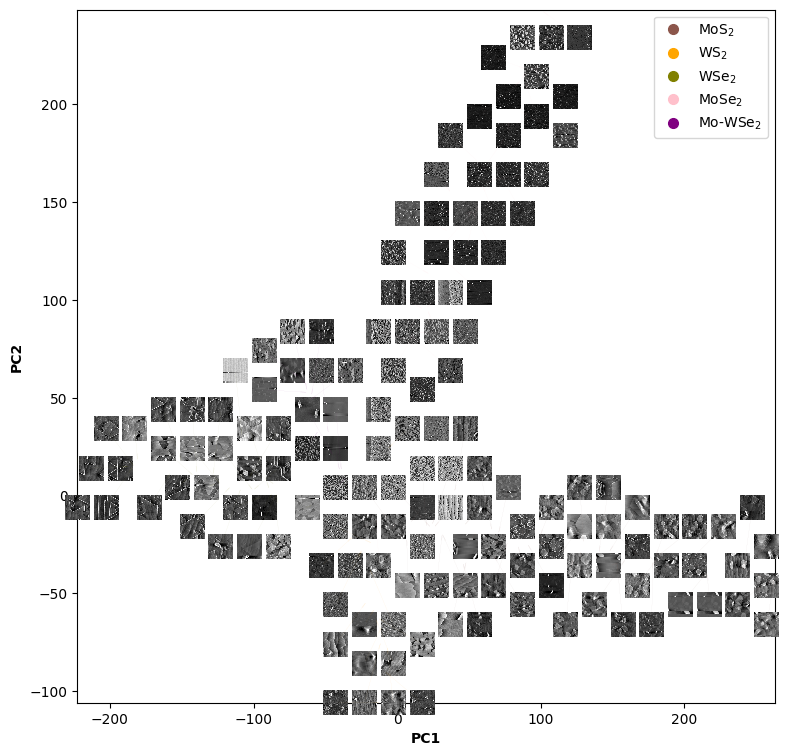

In [47]:
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
import matplotlib.pyplot as plt
import numpy as np

def create_grid(x_min, x_max, y_min, y_max, cell_size):
    x_grid = np.arange(x_min, x_max, cell_size)
    y_grid = np.arange(y_min, y_max, cell_size)
    return np.meshgrid(x_grid, y_grid)

def is_cell_valid(grid, i, j, min_cell_distance):
    for di in range(-min_cell_distance, min_cell_distance + 1):
        for dj in range(-min_cell_distance, min_cell_distance + 1):
            if 0 <= i + di < len(grid) and 0 <= j + dj < len(grid[0]):
                if grid[i + di][j + dj]:
                    return False
    return True

def find_nearest_empty_cell(grid, xi, yi, cell_size, x_min, y_min, max_distance, min_cell_distance):
    i, j = int((yi - y_min) / cell_size), int((xi - x_min) / cell_size)
    for r in range(max(len(grid), len(grid[0]))):
        for di in range(-r, r+1):
            for dj in range(-r, r+1):
                if abs(di) == r or abs(dj) == r:
                    new_i, new_j = i + di, j + dj
                    if 0 <= new_i < len(grid) and 0 <= new_j < len(grid[0]):
                        new_x = x_min + new_j * cell_size
                        new_y = y_min + new_i * cell_size
                        distance = ((new_x - xi)**2 + (new_y - yi)**2)**0.5
                        if distance <= max_distance and is_cell_valid(grid, new_i, new_j, min_cell_distance):
                            return new_i, new_j
    return None

x = features_2d[:, 0]
y = features_2d[:, 1]
xy = features_2d[:, :2]

fig, ax = plt.subplots(figsize=(9, 9))
ax.plot(x, y, '.', color='white')

# Set the axis limits
x_min, x_max = min(x) - 0.2, max(x) + 0.2
y_min, y_max = min(y) - 0.2, max(y) + 0.2
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Parameters
cell_size = 10  # Controls the granularity of the grid
image_size = 0.08  # Controls the size of the images
max_distance = 35#30  # Maximum allowed distance from original point
min_cell_distance = 1  # Minimum distance between occupied cells, in grid units

X, Y = create_grid(x_min, x_max, y_min, y_max, cell_size)
grid = [[False for _ in range(len(X[0]))] for _ in range(len(X))]

for i in range(len(Images)):
    xi, yi = x[i], y[i]
    
    # Find the nearest empty cell within max_distance and respecting min_cell_distance
    result = find_nearest_empty_cell(grid, xi, yi, cell_size, x_min, y_min, max_distance, min_cell_distance)
    
    if result:
        grid_i, grid_j = result
        grid[grid_i][grid_j] = True
        
        im_x, im_y = X[grid_i][grid_j], Y[grid_i][grid_j]
        
        im = Images[i]
        im = im.astype(float)
        im = np.clip(im, 0.0, 1.0)
        im = OffsetImage(im.transpose(1, 2, 0), zoom=image_size)
        img = im.get_children()[0]
        img.set_clim(vmin=0, vmax=0)
        im.image.axes = ax
        
        # Add the image
        ab = AnnotationBbox(im, (im_x, im_y), frameon=False, pad=0.01, bboxprops={'edgecolor': class_color2[T_targets[i]]})
        ax.add_artist(ab)
        
        # Add annotation arrow
        ax.annotate('', xy=(xi, yi), xytext=(im_x, im_y), arrowprops=dict(arrowstyle='->, head_width=0.03', color=class_color2[T_targets[i]], linewidth=0.02))

# Set the axis limits to include the images
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

plt.legend(custom, ['MoS$_2$', 'WS$_2$', 'WSe$_2$', 'MoSe$_2$', 'Mo-WSe$_2$'])
plt.xlabel('PC1', fontweight='bold')
plt.ylabel('PC2', fontweight='bold')
plt.savefig("Results/TMD_pca_image_spread.pdf", format="pdf", bbox_inches="tight")
plt.show()

# 9 Latent and Image Physical Features

In [8]:
GLCM_results = {'contrast':[], 'dissimilarity':[], 'homogeneity':[], 'energy':[], 'correlation':[], 'ASM':[]}
for item in X:
    img = item.transpose(1, 2, 0)*255
    glcm = extract_glcm_features(img[:, :, 0], levels=257)
    
    for key in glcm.keys():
        GLCM_results[key].append(glcm[key])
        


In [10]:
#ImageNet
#X = features
features_10d = features_2d#[:, :2]
x_rough, y_rough, rough = obtain_rms_roughness(X, features_10d)
x_steps, y_steps, num_steps = obtain_num_steps(X, features_10d)
x_density, y_density, density = obtain_defect_density(X, features_10d)
x_anisotropy, y_anisotropy, anisotropy = obtain_anisotropy(X, features_10d)
x_variation, y_variation, variation = obtain_local_variation(X, features_10d)
#y_blog_dog, #y_blog_dog, blog_dog = obtain_num_blog_dog(X, features)
x_contrast, y_contrast, contrast = obtain_contrast(GLCM_results, features_10d)
x_dissimilarity, y_dissimilarity, dissimilarity = obtain_dissimilarity(GLCM_results, features_10d)
x_homogeneity, y_homogeneity, homogeneity = obtain_homogeneity(GLCM_results, features_10d)
x_glcm, y_glcm, glcm_energy = obtain_energy(GLCM_results, features_10d)
x_correlatioin, y_correlatioin, correlation = obtain_correlation(GLCM_results, features_10d)
x_asm, y_asm, glcm_asm = obtain_ASM(GLCM_results, features_10d)

x_size, y_size, grain_size = obtain_grain_size(X, features_10d)
x_density, y_density, grain_density = obtain_grain_density(X, features_10d)
x_blog_dog, y_blog_dog, blog_dog = obtain_num_blob_dog(X, features_10d)

min r:  -0.0484808231077648 max r:  0.04023997239306966
Model_roughness_index:  5 3
min r:  -0.05267467137923296 max r:  0.06643617306068805
Model_num_steps_index:  1 0
(1026,)
min r:  -0.04404102517795011 max r:  0.04168495328807423
Model_defect_density_index:  4 1
min r:  -0.08214817118758451 max r:  0.06783280041027737
Model_anisotropy_index:  8 5
min r:  -0.056316515896678604 max r:  0.03690096485961384
Model_local_variation_index:  5 3
min r:  -0.032345344669767274 max r:  0.04364227822455421
Model_contrast_index:  5 9
min r:  -0.04825454420797309 max r:  0.047166414915925096
Model_dissimilarity_index:  5 9
min r:  -0.07796810891397435 max r:  0.05804929560477821
Model_homogeneity_index:  8 5
min r:  -0.0767507376684918 max r:  0.04495114353141042
Model_energy_index:  8 5
min r:  -0.032661886201580656 max r:  0.01017797339020139
Model_correlation_index:  8 0
min r:  -0.04800134066897462 max r:  0.036924399970555966
Model_ASM_index:  9 7


/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


min r:  -0.019005219253671504 max r:  0.09713544527121283
Model_grain_size_index:  9 1


/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


min r:  -0.0696397418319612 max r:  0.02775112751018915
Model_grain_density_index:  5 9


/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/skimage/feature/blob.py:359: FutureWarning: Automatic detection of the color channel was deprecated in v0.19, and `channel_axis=None` will be the new default in v0.21. Set `channel_axis=-1` explicitly to silence this warning.
  gaussian_previous = gaussian(image, sigma_list[0], mode='reflect')
/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/skimage/feature/blob.py:361: FutureWarning: Automatic detection of the color channel was deprecated in v0.19, and `channel_axis=None` will be the new default in v0.21. Set `channel_axis=-1` explicitly to silence this warning.
  gaussian_current = gaussian(image, s, mode='reflect')


min r:  -0.05076815750905287 max r:  0.027817388853260096
Model_num_blog_dog_index:  0 3


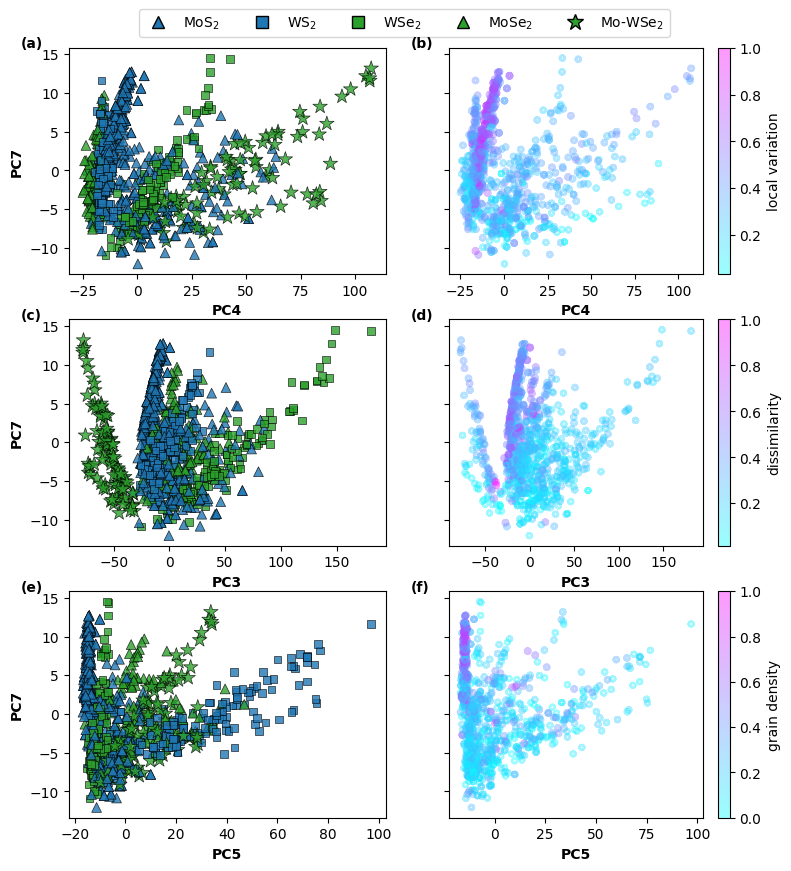

In [18]:
class_dict = {0:'MoS2',1:'WS2', 2:'WSe2', 3:'MoSe2', 4:'Mo-WSe2'}
hue = [class_dict[item] for item in T_targets]
size = [class_dict[item] for item in T_targets]
sizes = {'MoS2':50, 'WS2':30, 'WSe2':30, 'MoSe2':50, 'Mo-WSe2':120}

colors = {'MoS2': 'tab:blue', 'WS2': 'tab:blue', 'WSe2': 'tab:green', 'MoSe2': 'tab:green', 'Mo-WSe2': 'tab:green'}
markers = {'MoS2': "^", 'WS2': "s", 'WSe2': "s", 'MoSe2': "^", 'Mo-WSe2': "*"}

rows = 3
columns = 2
alpha = 0.8
fig, ax = plt.subplots(rows, columns, figsize=(9, 10), sharey=True)#, sharex=True, sharey=True

x, y,data = x_variation, y_variation, variation
zero_zero = sns.scatterplot(ax=ax[0, 0], x =x, y = y,style = [class_dict[item] for item in T_targets], markers=markers, hue =hue, size=size, sizes=sizes ,palette = colors,edgecolor='black',linewidth=0.5, alpha=alpha)

custom = [Line2D([], [], marker=markers['MoS2'],markersize=8, color=colors['MoS2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
          Line2D([], [], marker=markers['WS2'],markersize=8, color=colors['WS2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
         Line2D([], [], marker=markers['WSe2'], markersize=8,color=colors['WSe2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
         Line2D([], [], marker=markers['MoSe2'], markersize=8,color=colors['MoSe2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
         Line2D([], [], marker=markers['Mo-WSe2'], markersize=12,color=colors['Mo-WSe2'], linestyle='None',markeredgecolor='black',markeredgewidth=1)]

zero_zero.legend_.remove()

ax[0, 0].legend(custom, ['MoS$_2$', 'WS$_2$', 'WSe$_2$', 'MoSe$_2$', 'Mo-WSe$_2$'], bbox_to_anchor=(0.2, 1.2), loc='upper left', ncol=5)#, loc='lower left')


zero_one = ax[0, 1].scatter(x, y,s=data/max(data), c=data/max(data), alpha=0.4, linewidth=5, marker='*', cmap='cool')
cbar = fig.colorbar(zero_one)
cbar.set_label("local variation")


x, y, data = x_dissimilarity, y_dissimilarity, dissimilarity#x_contrast, y_contrast, contrast#x_anisotropy, y_anisotropy, anisotropy
one_zero = sns.scatterplot(ax=ax[1, 0], x =x, y = y,style = [class_dict[item] for item in T_targets], markers=markers, hue =hue, size=size, sizes=sizes ,palette = colors,edgecolor='black',linewidth=0.5, alpha=alpha)
one_one = ax[1, 1].scatter(x, y,s=data/max(data), c=data/max(data), alpha=0.4, linewidth=5, marker='*', cmap='cool')
cbar = fig.colorbar(one_one)
cbar.set_label("dissimilarity")
one_zero.legend_.remove()

x, y, data = x_density, y_density, grain_density
two_zero = sns.scatterplot(ax=ax[2, 0], x =x, y = y,style = [class_dict[item] for item in T_targets], markers=markers, hue =hue, size=size, sizes=sizes ,palette = colors,edgecolor='black',linewidth=0.5, alpha=alpha)
two_one = ax[2, 1].scatter(x, y,s=data/max(data), c=data/max(data), alpha=0.4, linewidth=5, marker='*', cmap='cool')
cbar = fig.colorbar(two_one)
cbar.set_label("grain density")
two_zero.legend_.remove()

ax[0, 0].set_xlabel('PC4',fontweight='bold')
ax[0, 1].set_xlabel('PC4',fontweight='bold')
ax[1, 0].set_xlabel('PC3',fontweight='bold')
ax[1, 1].set_xlabel('PC3',fontweight='bold')
ax[2, 0].set_xlabel('PC5',fontweight='bold')
ax[2, 1].set_xlabel('PC5',fontweight='bold')
ax[0, 0].set_ylabel('PC7',fontweight='bold')
ax[1, 0].set_ylabel('PC7',fontweight='bold')
ax[2, 0].set_ylabel('PC7',fontweight='bold')

x0, y0, = -0.15, 1.0
ax[0,0].text(x0, y0,'(a)', fontweight='bold', transform=ax[0,0].transAxes)
ax[0,1].text(x0, y0,'(b)', fontweight='bold', transform=ax[0,1].transAxes)
ax[1,0].text(x0, y0,'(c)', fontweight='bold', transform=ax[1,0].transAxes)
ax[1,1].text(x0, y0,'(d)', fontweight='bold', transform=ax[1,1].transAxes)
ax[2,0].text(x0, y0,'(e)', fontweight='bold', transform=ax[2,0].transAxes)
ax[2,1].text(x0, y0,'(f)', fontweight='bold', transform=ax[2,1].transAxes)

plt.savefig("Results/TMD_physical.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [19]:

def low_high_ppt_image(image_property, X, groups):

    prop_ordered_small = sorted(range(len(image_property)), key=lambda k: image_property[k])
    prop_ordered_big = np.array(list(reversed(prop_ordered_small)))


    
    sgroup_present = []
    small_index = []
    for index in prop_ordered_small:
        g = groups[index]
        if g not in sgroup_present:
            small_index.append(index)
            sgroup_present.append(g)
    print('small len: ', len(small_index))
    
    bgroup_present = []
    big_index = []
    for index in prop_ordered_big:
        g = groups[index]
        if g not in bgroup_present:
            big_index.append(index)
            bgroup_present.append(g)

    print('big len: ', len(big_index))
    X_small = X[small_index]
    X_big = X[big_index]
    
    return X_small, X_big

Xvariation_small, Xvariation_big = low_high_ppt_image(variation, X, groups)

Xdiss_small, Xdiss_big = low_high_ppt_image(dissimilarity, X, groups)

Xgrain_small, Xgrain_big = low_high_ppt_image(grain_density, X, groups)

small len:  626
big len:  626
small len:  626
big len:  626
small len:  626
big len:  626


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


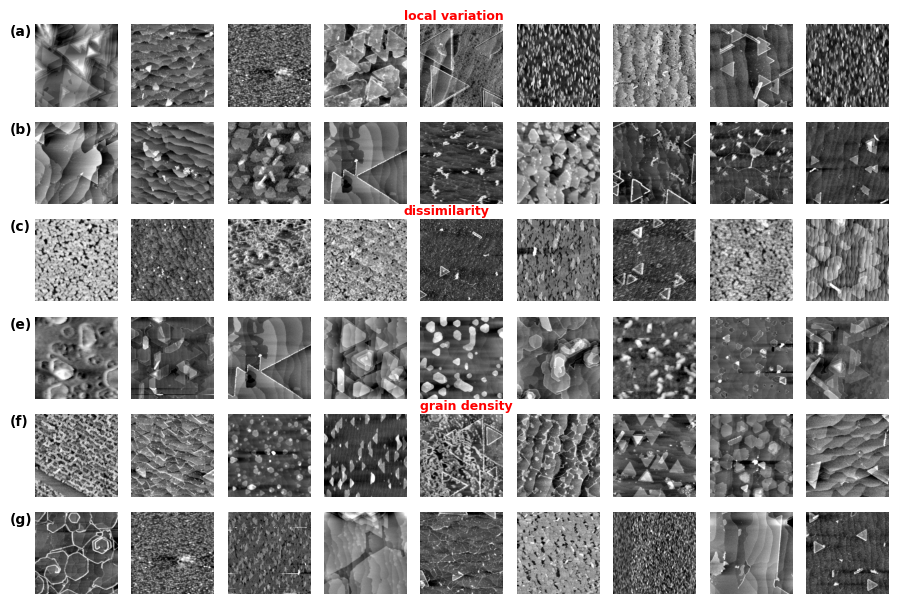

In [21]:
j = 0
k = 0
rows = 6
columns = 9

fig, ax = plt.subplots(rows, columns, figsize=(9, 6))
for i in range(columns):
    i = i+156
    image0 = Xvariation_big[i].transpose(1, 2, 0)
    image1 = Xvariation_small[i].transpose(1, 2, 0)
    image2 = Xdiss_big[i].transpose(1, 2, 0)
    image3 = Xdiss_small[i].transpose(1, 2, 0)
    image4 = Xgrain_big[i].transpose(1, 2, 0)
    image5 = Xgrain_small[i].transpose(1, 2, 0)
    
    
   
    ax[j, k].imshow(image0, cmap='binary')
    ax[j, k].axis('off')
    #ax[j, k].set_title('local variation', size=16,  weight='bold')#' (i)')
    
    ax[j+1, k].imshow(image1,cmap='binary')
    ax[j+1, k].axis('off')
    
    
    ax[j+2, k].imshow(image2,cmap='binary')
    ax[j+2, k].axis('off')
    #ax[j+2, k].set_title('rms roughness', size=16,  weight='bold')#' (i)')
    
    ax[j+3, k].imshow(image3,cmap='binary')
    ax[j+3, k].axis('off')
   
    
    
    ax[j+4, k].imshow(image4,cmap='binary')
    ax[j+4, k].axis('off')
    #ax[j+4, k].set_title('blog dog', size=16,  weight='bold')#' (i)') 
    
    ax[j+5, k].imshow(image5,cmap='binary')
    ax[j+5, k].axis('off')    
    k += 1    
    
    fig.tight_layout()
x0, y0 = -0.20, 1.05   
ax[j,4].text(x0, y0,'local variation', fontweight='bold', color='red', size=9, transform=ax[j,4].transAxes)
ax[j+2,4].text(x0, y0,'dissimilarity', fontweight='bold', color='red', size=9, transform=ax[j+2,4].transAxes)
ax[j+4,4].text(x0+0.2, y0,'grain density', fontweight='bold', color='red', size=9, transform=ax[j+4,4].transAxes)

x0, y0 = -0.30, 0.85 
ax[j,0].text(x0, y0,'(a)', fontweight='bold', color='black', size=10, transform=ax[j,0].transAxes)
ax[j+1,0].text(x0, y0,'(b)', fontweight='bold', color='black', size=10, transform=ax[j+1,0].transAxes)
ax[j+2,0].text(x0, y0,'(c)', fontweight='bold', color='black', size=10, transform=ax[j+2,0].transAxes)
ax[j+3,0].text(x0, y0,'(e)', fontweight='bold', color='black', size=10, transform=ax[j+3,0].transAxes)
ax[j+4,0].text(x0, y0,'(f)', fontweight='bold', color='black', size=10, transform=ax[j+4,0].transAxes)
ax[j+5,0].text(x0, y0,'(g)', fontweight='bold', color='black', size=10, transform=ax[j+5,0].transAxes)

plt.savefig("Results/TMD_physical_img.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [9]:
x_rough, y_rough, rough = obtain_rms_roughness(X, features_10d)
x_steps, y_steps, num_steps = obtain_num_steps(X, features_10d)
x_defect_density, y_defect_density, defect_density = obtain_defect_density(X, features_10d)
x_anisotropy, y_anisotropy, anisotropy = obtain_anisotropy(X, features_10d)
x_variation, y_variation, variation = obtain_local_variation(X, features_10d)
#y_blog_dog, #y_blog_dog, blog_dog = obtain_num_blog_dog(X, features)
x_contrast, y_contrast, contrast = obtain_contrast(GLCM_results, features_10d)
x_dissimilarity, y_dissimilarity, dissimilarity = obtain_dissimilarity(GLCM_results, features_10d)
x_homogeneity, y_homogeneity, homogeneity = obtain_homogeneity(GLCM_results, features_10d)
x_glcm, y_glcm, glcm_energy = obtain_energy(GLCM_results, features_10d)
x_correlatioin, y_correlatioin, correlation = obtain_correlation(GLCM_results, features_10d)
x_asm, y_asm, glcm_asm = obtain_ASM(GLCM_results, features_10d)

x_size, y_size, grain_size = obtain_grain_size(X, features_10d)
x_grain_density, y_grain_density, grain_density = obtain_grain_density(X, features_10d)
x_blog_dog, y_blog_dog, blog_dog = obtain_num_blob_dog(X, features_10d)



x_feature = features_10d

y_target = rough
reg = LinearRegression().fit(features_10d, y_target)
print('rough_score: ', reg.score(x_feature, y_target)**0.5)
rough_coef = reg.coef_
intercept = reg.intercept_

y_target = num_steps
reg = LinearRegression().fit(features_10d, y_target)
print('num_steps_score: ', reg.score(x_feature, y_target)**0.5)
num_steps_coef = reg.coef_

y_target = defect_density
reg = LinearRegression().fit(features_10d, y_target)
print('density_score: ', reg.score(x_feature, y_target)**0.5)
defect_density_coef = reg.coef_

y_target = anisotropy
reg = LinearRegression().fit(features_10d, y_target)
print('anisotropy_score: ', reg.score(x_feature, y_target)**0.5)
anisotropy_coef = reg.coef_

y_target = variation
reg = LinearRegression().fit(features_10d, y_target)
print('variation_score: ', reg.score(x_feature, y_target)**0.5)
variation_coef = reg.coef_

y_target = contrast
reg = LinearRegression().fit(features_10d, y_target)
print('contrast_score: ', reg.score(x_feature, y_target)**0.5)
contrast_coef = reg.coef_

y_target = dissimilarity
reg = LinearRegression().fit(features_10d, y_target)
print('dissimilarity_score: ', reg.score(x_feature, y_target)**0.5)
dissimilarity_coef = reg.coef_


y_target = homogeneity
reg = LinearRegression().fit(features_10d, y_target)
print('homogeneity_score: ', reg.score(x_feature, y_target)**0.5)
homogeneity_coef = reg.coef_

y_target = glcm_energy
reg = LinearRegression().fit(features_10d, y_target)
print('glcm_energy_score: ', reg.score(x_feature, y_target)**0.5)
glcm_energy_coef = reg.coef_

y_target = correlation
reg = LinearRegression().fit(features_10d, y_target)
print('correlation_score: ', reg.score(x_feature, y_target)**0.5)
correlation_coef = reg.coef_

y_target = glcm_asm
reg = LinearRegression().fit(features_10d, y_target)
print('glcm_asm_score: ', reg.score(x_feature, y_target)**0.5)
glcm_asm_coef =  reg.coef_

y_target = blog_dog
reg = LinearRegression().fit(features_10d, y_target)
print('blog_dog_score: ', reg.score(x_feature, y_target)**0.5)
blog_dog_coef = reg.coef_


y_target = grain_size
reg = LinearRegression().fit(features_10d, y_target)
print('grain_size_score: ', reg.score(x_feature, y_target)**0.5)
grain_size_coef = reg.coef_

y_target = grain_density
reg = LinearRegression().fit(features_10d, y_target)
print('grain_density_score: ', reg.score(x_feature, y_target)**0.5)
grain_density_coef = reg.coef_



min r:  -0.2666208559577199 max r:  0.432596882059247
Model_roughness_index:  3 6
min r:  -0.36918105000010903 max r:  0.15313794138115291
Model_num_steps_index:  6 2
(1026,)
min r:  -0.19861825117346188 max r:  0.21277634411186913
Model_defect_density_index:  2 6
min r:  -0.45403834119632835 max r:  0.16824559672074138
Model_anisotropy_index:  6 3
min r:  -0.2487857408363991 max r:  0.4952727173552354
Model_local_variation_index:  3 6
min r:  -0.25381054477190446 max r:  0.34668176231884373
Model_contrast_index:  2 6
min r:  -0.2796854982567233 max r:  0.4768000399243331
Model_dissimilarity_index:  2 6
min r:  -0.4814378455101524 max r:  0.17235682468683314
Model_homogeneity_index:  6 3
min r:  -0.3134149125708647 max r:  0.15363181102210546
Model_energy_index:  6 9
min r:  -0.33337730505253726 max r:  0.253055709797569
Model_correlation_index:  1 2
min r:  -0.13662565719644112 max r:  0.09758032842738908
Model_ASM_index:  6 9


/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


min r:  -0.10871891340059461 max r:  0.18781575179608687
Model_grain_size_index:  2 3


/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


min r:  -0.24682638330917067 max r:  0.4789944771888748
Model_grain_density_index:  4 6


/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/skimage/feature/blob.py:359: FutureWarning: Automatic detection of the color channel was deprecated in v0.19, and `channel_axis=None` will be the new default in v0.21. Set `channel_axis=-1` explicitly to silence this warning.
  gaussian_previous = gaussian(image, sigma_list[0], mode='reflect')
/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/skimage/feature/blob.py:361: FutureWarning: Automatic detection of the color channel was deprecated in v0.19, and `channel_axis=None` will be the new default in v0.21. Set `channel_axis=-1` explicitly to silence this warning.
  gaussian_current = gaussian(image, s, mode='reflect')


min r:  -0.2915979414071664 max r:  0.41691392904987623
Model_num_blog_dog_index:  3 6
rough_score:  0.6055112773636162
num_steps_score:  0.4713048294821686
density_score:  0.38875111871987117
anisotropy_score:  0.5092606074141729
variation_score:  0.6510971940815539
contrast_score:  0.5905881727704466
dissimilarity_score:  0.6587355374131304
homogeneity_score:  0.5499996319907687
glcm_energy_score:  0.3771636983515356
correlation_score:  0.5743225347140204
glcm_asm_score:  0.18826844834735748
blog_dog_score:  0.6478150167674015
grain_size_score:  0.2496161582894091
grain_density_score:  0.6101809370414703


In [10]:
properties_coef = []
properties_coef.append(grain_size_coef)
properties_coef.append(num_steps_coef)
properties_coef.append(anisotropy_coef)
properties_coef.append(homogeneity_coef)
properties_coef.append(glcm_energy_coef)
properties_coef.append(correlation_coef)
properties_coef.append(glcm_asm_coef)

properties_coef.append(grain_density_coef)
properties_coef.append(blog_dog_coef)
properties_coef.append(rough_coef)
properties_coef.append(defect_density_coef)
properties_coef.append(variation_coef)
properties_coef.append(contrast_coef)
properties_coef.append(dissimilarity_coef)

properties_coef = np.array(properties_coef)
print(properties_coef.shape)

(14, 10)


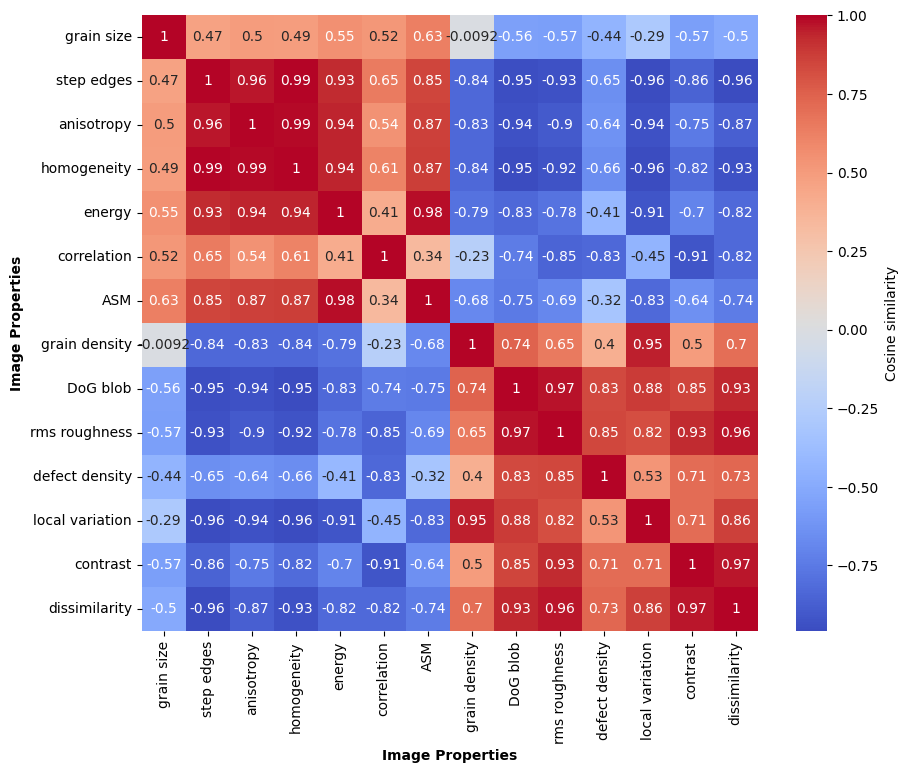

In [11]:

latent_features = (properties_coef)


cosine_similarities = cosine_similarity(latent_features)

#tickslabel = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
#tickslabel = ['grain size', 'grain density', 'DoG blog', 'rms roughness', 'step edges', 'defect density', 'anisotropy', 'local variation', 'contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']
tickslabel = ['grain size', 'step edges', 'anisotropy', 'homogeneity', 'energy', 'correlation', 'ASM', 'grain density', 'DoG blob', 'rms roughness', 'defect density', 'local variation', 'contrast', 'dissimilarity']

plt.figure(figsize=(10, 8))
sns.heatmap(cosine_similarities, annot=True, cmap='coolwarm', square=True, xticklabels=tickslabel, yticklabels=tickslabel, cbar_kws={'label': 'Cosine similarity'})
#plt.title("Cosine similarity heatmap of properties regression")
plt.xlabel("Image Properties",fontweight='bold')
plt.ylabel("Image Properties",fontweight='bold')
plt.savefig("Results/TMD_property_similarity.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [15]:
#ImageNet
#X = features

#x_rough, y_rough, rough = obtain_rms_roughness(X, features_10d)
x_feature = features_10d

def regression_direction(features_10d, intercept, coeficient):
    corre_vector = []
    for datapoint in features_10d:
        y_point = intercept
        for index, component in enumerate(datapoint):
            y_point += coeficient[index]*component
        corre_vector.append(y_point)
    return corre_vector


y_target = rough
reg = LinearRegression().fit(features_10d, y_target)
print('rough_score: ', reg.score(x_feature, y_target)**0.5)
coeficient = reg.coef_
intercept = reg.intercept_
rough_dim = regression_direction(features_10d, intercept, coeficient)

y_target = variation
reg = LinearRegression().fit(features_10d, y_target)
print('variation_score: ', reg.score(x_feature, y_target)**0.5)
coeficient = reg.coef_
intercept = reg.intercept_
variation_dim = regression_direction(features_10d, intercept, coeficient)



y_target = dissimilarity
reg = LinearRegression().fit(features_10d, y_target)
print('dissimilarity_score: ', reg.score(x_feature, y_target)**0.5)
coeficient = reg.coef_
intercept = reg.intercept_
dissimilarity_dim = regression_direction(features_10d, intercept, coeficient)


y_target = correlation
reg = LinearRegression().fit(features_10d, y_target)
print('correlation_score: ', reg.score(x_feature, y_target)**0.5)
coeficient = reg.coef_
intercept = reg.intercept_
correlation_dim = regression_direction(features_10d, intercept, coeficient)


y_target = blog_dog
reg = LinearRegression().fit(features_10d, y_target)
print('blog_dog_score: ', reg.score(x_feature, y_target)**0.5)
coeficient = reg.coef_
intercept = reg.intercept_
blog_dog_dim = regression_direction(features_10d, intercept, coeficient)

y_target = homogeneity
reg = LinearRegression().fit(features_10d, y_target)
print('homogeneity_score: ', reg.score(x_feature, y_target)**0.5)
coeficient = reg.coef_
intercept = reg.intercept_
homogeneity_dim = regression_direction(features_10d, intercept, coeficient)

y_target = grain_density
reg = LinearRegression().fit(features_10d, y_target)
print('homogeneity_score: ', reg.score(x_feature, y_target)**0.5)
coeficient = reg.coef_
intercept = reg.intercept_
homogeneity_dim = regression_direction(features_10d, intercept, coeficient)



rough_score:  0.6055112773636162
variation_score:  0.6510971940815539
dissimilarity_score:  0.6587355374131304
correlation_score:  0.5743225347140204
blog_dog_score:  0.6478150167674015
homogeneity_score:  0.5499996319907687
homogeneity_score:  0.6101809370414703


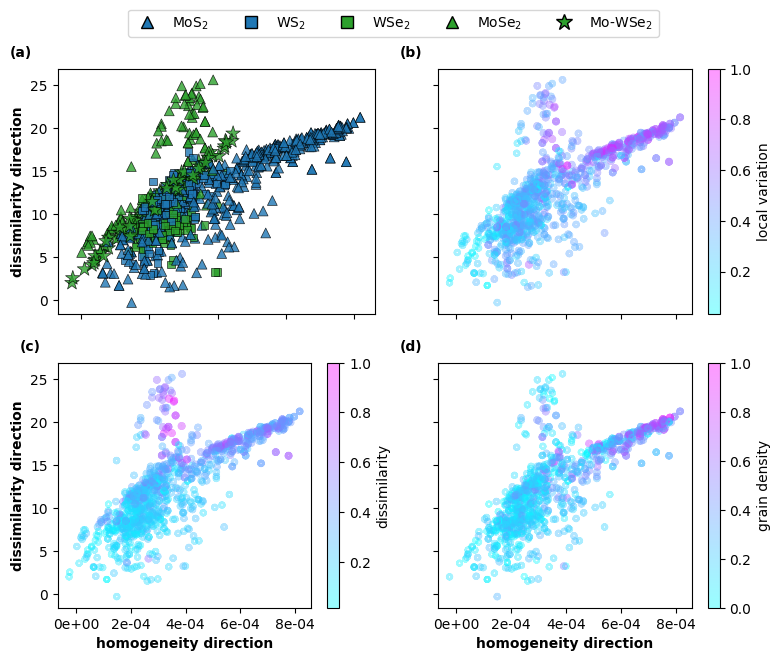

In [28]:
import matplotlib.ticker as mtick

class_dict = {0:'MoS2',1:'WS2', 2:'WSe2', 3:'MoSe2', 4:'Mo-WSe2'}
hue = [class_dict[item] for item in T_targets]
size = [class_dict[item] for item in T_targets]
sizes = {'MoS2':50, 'WS2':30, 'WSe2':30, 'MoSe2':50, 'Mo-WSe2':120}

colors = {'MoS2': 'tab:blue', 'WS2': 'tab:blue', 'WSe2': 'tab:green', 'MoSe2': 'tab:green', 'Mo-WSe2': 'tab:green'}
markers = {'MoS2': "^", 'WS2': "s", 'WSe2': "s", 'MoSe2': "^", 'Mo-WSe2': "*"}

rows = 2
columns = 2
alpha = 0.8
fig, ax = plt.subplots(rows, columns, figsize=(9, 7), sharex=True, sharey=True)

x, y,data = homogeneity_dim, dissimilarity_dim, variation
#x, y,data = [i for i in range(1026)], correlation_dim, correlation
zero_zero = sns.scatterplot(ax=ax[0, 0], x =x, y = y,style = [class_dict[item] for item in T_targets], markers=markers, hue =hue, size=size, sizes=sizes ,palette = colors,edgecolor='black',linewidth=0.5, alpha=alpha)

custom = [Line2D([], [], marker=markers['MoS2'],markersize=8, color=colors['MoS2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
          Line2D([], [], marker=markers['WS2'],markersize=8, color=colors['WS2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
         Line2D([], [], marker=markers['WSe2'], markersize=8,color=colors['WSe2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
         Line2D([], [], marker=markers['MoSe2'], markersize=8,color=colors['MoSe2'], linestyle='None',markeredgecolor='black',markeredgewidth=1),
         Line2D([], [], marker=markers['Mo-WSe2'], markersize=12,color=colors['Mo-WSe2'], linestyle='None',markeredgecolor='black',markeredgewidth=1)]

zero_zero.legend_.remove()

ax[0, 0].legend(custom, ['MoS$_2$', 'WS$_2$', 'WSe$_2$', 'MoSe$_2$', 'Mo-WSe$_2$'], bbox_to_anchor=(0.2, 1.27), loc='upper left', ncol=5)#, loc='lower left')


zero_one = ax[0, 1].scatter(x, y,s=data/max(data), c=data/max(data), alpha=0.4, linewidth=5, marker='*', cmap='cool')
cbar = fig.colorbar(zero_one)
cbar.set_label("local variation")


x, y, data = homogeneity_dim,dissimilarity_dim, dissimilarity#x_anisotropy, y_anisotropy, anisotropy

one_zero = ax[1, 0].scatter(x, y,s=data/max(data), c=data/max(data), alpha=0.4, linewidth=5, marker='*', cmap='cool')
cbar = fig.colorbar(one_zero)
cbar.set_label("dissimilarity")
#one_zero.legend_.remove()

x, y, data = homogeneity_dim, dissimilarity_dim, grain_density
one_one = ax[1, 1].scatter(x, y,s=data/max(data), c=data/max(data), alpha=0.4, linewidth=5, marker='*', cmap='cool')
cbar = fig.colorbar(one_one)
cbar.set_label("grain density")

ax[1, 0].set_xlabel('homogeneity direction',fontweight='bold')
ax[1, 1].set_xlabel('homogeneity direction',fontweight='bold')
ax[0, 0].set_ylabel('dissimilarity direction',fontweight='bold')
ax[1, 0].set_ylabel('dissimilarity direction',fontweight='bold')
#ax[2, 0].set_ylabel('dissimilarity direction',fontweight='bold')

x0, y0, = -0.15, 1.05
#ax[1,0].ticklabel_format(scilimits=(0, 0))
#ax[1,1].ticklabel_format(scilimits=(0, 0))
ax[1,0].xaxis.set_major_formatter(mtick.FormatStrFormatter('%.0e'))
ax[0,0].text(x0, y0,'(a)', fontweight='bold', transform=ax[0,0].transAxes)
ax[0,1].text(x0, y0,'(b)', fontweight='bold', transform=ax[0,1].transAxes)
ax[1,0].text(x0, y0,'(c)', fontweight='bold', transform=ax[1,0].transAxes)
ax[1,1].text(x0, y0,'(d)', fontweight='bold', transform=ax[1,1].transAxes)

plt.savefig("Results/TMD_physical_reg.pdf", format="pdf", bbox_inches="tight")
plt.show()